# FastSLAM 1.0 and 2.0 — Motion Noise and Algorithm Comparison

This notebook evaluates FastSLAM 1.0 and FastSLAM 2.0 under two different motion-noise levels.

## 1. Imports


In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt

from robotics.geometry import Pose, Angle
from robotics.maps import Landmark, LandmarkMap
from robotics.robot import Robot
from robotics.camera import Camera
from robotics.control import VelocityControl
from robotics.fastslam import FastSLAM, LandmarkEstimate
from robotics.fastslam2 import FastSLAM2

from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

## 2. Simulation Configuration


In [14]:
dt = 0.05
N_PARTICLES = 50

FOV = Angle.from_deg(100)
# SENSOR_RANGE = 3.0
SENSOR_RANGE = 5.0

RANGE_STD = 0.05
BEARING_STD = np.deg2rad(1.0)

Q = np.diag([
    RANGE_STD**2,
    BEARING_STD**2
])

x0 = Pose(
    -3.0,
    -2.0,
    Angle.from_deg(0)
)

LOW_MOTION_NOISE = (0.20, 0.02)
HIGH_MOTION_NOISE = (0.50, 0.05)


### Measurement Model

For a particle with pose

$$
\mathbf{x}_t^{[k]} =
\begin{bmatrix}
x_t^{[k]} & y_t^{[k]} & \theta_t^{[k]}
\end{bmatrix}^T,
$$

and a landmark estimate

$$
\boldsymbol{\mu}_j =
\begin{bmatrix}
m_{j,x} & m_{j,y}
\end{bmatrix}^T,
$$

the relative displacement between the particle and the landmark is

$$
\boldsymbol{\delta}_j =
\begin{bmatrix}
\Delta x_j \\
\Delta y_j
\end{bmatrix}
=
\begin{bmatrix}
m_{j,x} - x_t^{[k]} \\
m_{j,y} - y_t^{[k]}
\end{bmatrix},
$$

with

$$
q_j = \boldsymbol{\delta}_j^T\boldsymbol{\delta}_j
= \Delta x_j^2 + \Delta y_j^2.
$$

The predicted range-bearing measurement is therefore

$$
\hat{\mathbf{z}}_j =
h(\boldsymbol{\mu}_j,\mathbf{x}_t^{[k]})
=
\begin{bmatrix}
\sqrt{q_j} \\
\operatorname{atan2}(\Delta y_j,\Delta x_j)-\theta_t^{[k]}
\end{bmatrix}.
$$

The measurement noise is modeled as a zero-mean Gaussian distribution with covariance

$$
Q_t =
\begin{bmatrix}
\sigma_r^2 & 0 \\
0 & \sigma_\phi^2
\end{bmatrix},
$$

where ($\sigma_r$) and ($\sigma_\phi$) represent the range and bearing measurement uncertainties, respectively.

### Measurement Jacobian and Inverse Measurement Model

The Jacobian of the measurement model with respect to the landmark position is

$$
H_j =
\frac{\partial h}{\partial \boldsymbol{\mu}_j}
=
\begin{bmatrix}
\dfrac{\Delta x_j}{\sqrt{q_j}} &
\dfrac{\Delta y_j}{\sqrt{q_j}}
\\[6pt]
-\dfrac{\Delta y_j}{q_j} &
\dfrac{\Delta x_j}{q_j}
\end{bmatrix}.
$$

For an existing landmark with covariance ($\Sigma_j$), its uncertainty projected into the measurement space is

$$
S_j = H_j\Sigma_jH_j^T + Q_t.
$$

This covariance is subsequently used both in the measurement likelihood and in the EKF update associated with each landmark.

When a measurement

$$
\mathbf{z}_t =
\begin{bmatrix}
r_t \\
\phi_t
\end{bmatrix}
$$

is associated with a new landmark, the inverse measurement model is used to initialize its position:

$$
h^{-1}(\mathbf{z}_t,\mathbf{x}_t^{[k]})
=
\begin{bmatrix}
x_t^{[k]} + r_t\cos(\theta_t^{[k]}+\phi_t) \\
y_t^{[k]} + r_t\sin(\theta_t^{[k]}+\phi_t)
\end{bmatrix}.
$$

Defining

$$
\alpha = \theta_t^{[k]}+\phi_t,
$$

the Jacobian of the inverse measurement model with respect to the measurement is

$$
G_z =
\begin{bmatrix}
\cos\alpha & -r_t\sin\alpha \\
\sin\alpha & r_t\cos\alpha
\end{bmatrix}.
$$

Thus, the covariance of a newly initialized landmark is obtained by propagating the measurement uncertainty into Cartesian coordinates:

$$
\Sigma_j = G_z Q_t G_z^T.
$$

## 3. Landmark Map


In [15]:
landmark_positions = [
    (-1.5, -0.5),
    (1.0, -1.0),
    (3.5, -0.5),
    (4.0, 1.5),
    (1.5, 1.5),
    (-1.0, 1.5),
    (-2.0, 3.5),
    (0.5, 3.5),
    (3.0, 3.5),
    (1.0, 5.5),
    (4.0, 5.5),
]

landmarks = [
    Landmark(
        Pose(x, y, Angle(0.0)),
        signature
    )
    for signature, (x, y) in enumerate(landmark_positions)
]

x_lims = (-4, 7)
y_lims = (-3, 7)

env = LandmarkMap(
    landmarks,
    x_lims=x_lims,
    y_lims=y_lims
)


## 4. Robot, Camera and Control Sequence


In [16]:
camera = Camera(
    Pose(0.5, 0.0, Angle.from_deg(0)),
    field_of_veiw=FOV,
    sensor_range=SENSOR_RANGE,
    robot_pose=x0
)

robot = Robot(
    x0,
    sensors=[camera]
)

robot_desired = Robot(x0)


In [17]:
commands = []

v = 0.8
turn_rate = np.pi / 2

step_distance = v * dt
horizontal_distance = 8.0
vertical_distance = 4.0

horizontal_steps = round(horizontal_distance / step_distance)
vertical_steps = round(vertical_distance / step_distance)
turn_steps = round((np.pi / 2) / (turn_rate * dt))

commands += [VelocityControl(v, 0.0, dt)] * horizontal_steps
commands += [VelocityControl(0.0, turn_rate, dt)] * turn_steps
commands += [VelocityControl(v, 0.0, dt)] * vertical_steps
commands += [VelocityControl(0.0, turn_rate, dt)] * turn_steps

commands += [VelocityControl(v, 0.0, dt)] * horizontal_steps
commands += [VelocityControl(0.0, -turn_rate, dt)] * turn_steps
commands += [VelocityControl(v, 0.0, dt)] * vertical_steps
commands += [VelocityControl(0.0, -turn_rate, dt)] * turn_steps

commands += [VelocityControl(v, 0.0, dt)] * horizontal_steps
control_sequence = commands


### FastSLAM 1.0 Overview

FastSLAM represents the posterior distribution using a Rao-Blackwellized particle filter. Each particle contains a hypothesis for the robot trajectory together with an independent EKF estimate for each landmark:

$$
p(x_{1:t},m \mid z_{1:t},u_{1:t})
=
p(x_{1:t}\mid z_{1:t},u_{1:t})
\prod_j
p(m_j\mid x_{1:t},z_{1:t}).
$$

At each time step, the implementation performs the following operations:

1. A new robot pose is sampled for each particle according to the motion model.
2. The expected measurement and likelihood are evaluated for the landmarks contained in each particle.
3. Measurements are associated with existing landmarks or used to initialize new landmarks.
4. Associated landmarks are updated using an EKF correction.
5. A weight is assigned to each particle according to the measurement likelihoods.
6. Particles are resampled according to their normalized weights.

Consequently, each particle represents both a possible robot trajectory and its corresponding landmark map.

## 5. FastSLAM Simulation

The robot follows the same ground-truth trajectory in both experiments. Only the motion-noise parameters used by FastSLAM are changed.

In [18]:
def weighted_pose(particles, weights):
    x = sum(w * p.pose.x for p, w in zip(particles, weights))
    y = sum(w * p.pose.y for p, w in zip(particles, weights))

    sin_theta = sum(w * p.pose.th.sin for p, w in zip(particles, weights))
    cos_theta = sum(w * p.pose.th.cos for p, w in zip(particles, weights))

    return Pose(
        x,
        y,
        Angle.atan2(sin_theta, cos_theta)
    )


def initialize_fastslam(algorithm_cls=FastSLAM):
    slam = algorithm_cls(
        n_particles=N_PARTICLES,
        q_mat=Q
    )
    slam.initialize(x0)

    initial_cov = np.diag([0.01**2, 0.01**2])

    for particle in slam.particles:
        for landmark_id, landmark in enumerate(landmarks):
            particle.landmarks[landmark_id] = LandmarkEstimate(
                mu=np.array([[landmark.pos.x],
                             [landmark.pos.y]]),
                sigma=initial_cov.copy()
            )

    return slam

def position_error(experiment):
    gt = np.array([
        [p.x, p.y]
        for p in experiment["ground_truth"][1:]
    ])

    est = np.array([
        [p.x, p.y]
        for p in experiment["estimated"]
    ])

    return np.linalg.norm(est - gt, axis=1)


In [19]:
def run_experiment(motion_noise, seed, algorithm_cls=FastSLAM):
    np.random.seed(seed)

    robot_desired.pos = Pose(x0.x, x0.y, x0.th)

    # Reset robot state.
    robot.pos = Pose(x0.x, x0.y, x0.th)
    fastslam = initialize_fastslam(algorithm_cls)

    ground_truth_poses = [
        Pose(x0.x, x0.y, x0.th)
    ]

    desired_poses = [
        Pose(x0.x, x0.y, x0.th)
    ]

    estimated_poses = []
    particle_poses = []
    effective_particle_numbers = []
    measurements_history = []
    particle_maps = []

    for control in control_sequence:

        # Ground-truth robot motion is deterministic.
        applied_control = robot.applyControl(
            control,
            motion_noise=True
        )

        _ = robot_desired.applyControl(
            control,
            motion_noise=False
        )

        # Generate the sensor observation.
        robot.measure(env)
        measurement = robot.getCurrentSensorReadings()[0]
        detected_features = measurement["features"]

        # FastSLAM prediction + measurement update.
        diagnostics = fastslam.update(
            applied_control,
            detected_features,
            motion_noise=True,
            std_mot_noise=motion_noise,
            resample=False
        )

        weights = diagnostics["normalized_weights"]

        # Store particle poses before resampling.
        particle_poses.append([
            Pose(
                particle.pose.x,
                particle.pose.y,
                particle.pose.th
            )
            for particle in fastslam.particles
        ])


        estimated_poses.append(weighted_pose(fastslam.particles, weights))
        effective_particle_numbers.append(diagnostics["effective_particle_number"]) # how many particles are effective in representing the posterior distribution
        measurements_history.append(detected_features)


        ground_truth_poses.append(Pose(robot.pos.x, robot.pos.y, robot.pos.th))
        desired_poses.append(Pose(robot_desired.pos.x, robot_desired.pos.y, robot_desired.pos.th))

        best_particle = max(
            fastslam.particles,
            key=lambda particle: particle.weight
        )

        particle_maps.append(
            {
                landmark_id: {
                    "mu": landmark.mu.copy(),
                    "sigma": landmark.sigma.copy(),
                    "seen_count": landmark.seen_count,
                }
                for landmark_id, landmark
                in best_particle.landmarks.items()
                if landmark.seen_count > 1
            }
        )

        fastslam.resample()

    return {
        "desired_poses": desired_poses,
        "ground_truth": ground_truth_poses,
        "estimated": estimated_poses,
        "particles": particle_poses,
        "n_eff": np.asarray(effective_particle_numbers),
        "measurements": measurements_history,
        "particle_maps": particle_maps,
    }

### Particle Weighting in the Implementation

The particle-weight computation adopted in this implementation differs slightly from the FastSLAM 1.0 pseudocode considered in this work. A relevant difference between the FastSLAM 1.0 pseudocode and our implementation concerns the computation of the particle weight.

For a given particle \(k\) and a single observation ($z_t$), the pseudocode evaluates the measurement likelihood for each candidate landmark \(j\):

$$
w_j =
\frac{1}{\sqrt{|2\pi Q_j|}}
\exp\left[
-\frac{1}{2}
(z_t-\hat{z}_j)^T
Q_j^{-1}
(z_t-\hat{z}_j)
\right].
$$

The most likely correspondence is then selected as

$$
\hat{c} = \arg\max_j w_j,
$$

and the particle weight is defined as

$$
\boxed{
w^{[k]} = \max_j w_j
}.
$$

Thus, in the pseudocode, the particle weight is determined by the **single most likely landmark correspondence** for the current observation.

In our implementation, however, a particle may receive multiple observations at the same time step,

$$
Z_t = \{z_t^1, z_t^2, \ldots, z_t^M\}.
$$

For each observation ($z_t^i$), the association step still selects the most likely landmark,

$$
L_i =
\max_j p\left(z_t^i \mid x_t^{[k]}, \mu_j^{[k]}\right),
$$

but instead of retaining only one likelihood for the particle, the evidence provided by all observations is accumulated. Assuming conditional independence of the measurements given the particle state and map,

$$
p\left(Z_t \mid x_t^{[k]}, m^{[k]}\right)
=
\prod_{i=1}^{M} L_i.
$$

Therefore, our implementation uses

$$
\boxed{
w^{[k]}
\propto
\prod_{i=1}^{M} L_i
}
$$

as the particle weight.

To improve numerical stability, this product is computed in the logarithmic domain:

$$
\log w^{[k]}
=
\sum_{i=1}^{M} \log L_i.
$$

This corresponds directly to the implementation on ``fastslam.update_particle``:

```python
for z in measurements:
    likelihood, landmark_idx = self.associate(particle, z)
    log_weight += np.log(likelihood)
```

After accumulating the log-likelihoods, the conventional particle weight is recovered as

$$
w^{[k]} = \exp\left(\log w^{[k]}\right).
$$

Hence, the main difference is that **the pseudocode defines the particle weight from the maximum likelihood associated with the current observation, whereas our implementation aggregates the likelihood contributions of all observations available at the current time step**. Under the conditional independence assumption, this corresponds to evaluating the joint measurement likelihood

$$
p\left(Z_t \mid x_t^{[k]}, m^{[k]}\right)
=
\prod_{i=1}^{M}
p\left(z_t^i \mid x_t^{[k]}, m^{[k]}\right).
$$

Therefore, the resulting particle weight incorporates the consistency of the particle with the **complete measurement set** rather than relying solely on the most likely individual correspondence.

### Experiment 1 — Low Motion Noise


In [20]:
low_noise_result = run_experiment(LOW_MOTION_NOISE, seed=42)

### Experiment 2 — High Motion Noise


In [21]:
high_noise_result = run_experiment(HIGH_MOTION_NOISE, seed=42)

## 6. Ground Truth vs FastSLAM Estimated Trajectory

The two experiments are shown side by side using the same axes.


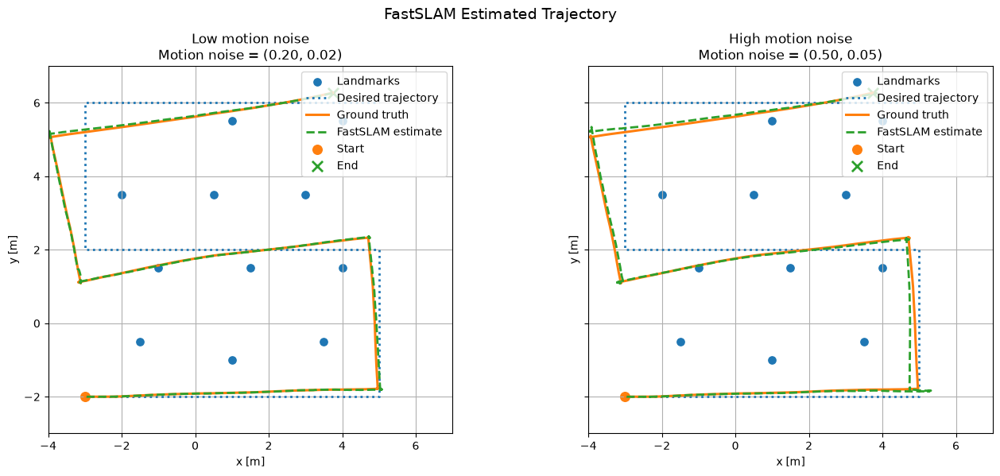

In [22]:
fig, axes = plt.subplots(
    1, 2,
    figsize=(14, 6),
    sharex=True,
    sharey=True
)

experiments = [
    ("Low motion noise", low_noise_result, LOW_MOTION_NOISE),
    ("High motion noise", high_noise_result, HIGH_MOTION_NOISE),
]

for ax, (title, result, noise) in zip(axes, experiments):
    desired = result["desired_poses"]
    gt = result["ground_truth"]
    est = result["estimated"]

    des_x = [p.x for p in desired]
    des_y = [p.y for p in desired]

    gt_x = [p.x for p in gt]
    gt_y = [p.y for p in gt]

    est_x = [p.x for p in est]
    est_y = [p.y for p in est]

    landmark_x = [lm.pos.x for lm in landmarks]
    landmark_y = [lm.pos.y for lm in landmarks]

    ax.scatter(
        landmark_x,
        landmark_y,
        marker="o",
        s=45,
        label="Landmarks"
    )

    ax.plot(
        des_x,
        des_y,
        linestyle=":",
        linewidth=2.0,
        label="Desired trajectory"
    )

    ax.plot(
        gt_x,
        gt_y,
        linewidth=2.2,
        label="Ground truth"
    )

    ax.plot(
        est_x,
        est_y,
        linestyle="--",
        linewidth=2.0,
        label="FastSLAM estimate"
    )

    ax.scatter(
        gt_x[0],
        gt_y[0],
        marker="o",
        s=70,
        label="Start"
    )

    ax.scatter(
        gt_x[-1],
        gt_y[-1],
        marker="x",
        s=90,
        linewidths=2,
        label="End"
    )

    ax.set_title(
        f"{title}\n"
        f"Motion noise = ({noise[0]:.2f}, {noise[1]:.2f})"
    )
    ax.set_xlabel("x [m]")
    ax.set_ylabel("y [m]")
    ax.set_xlim(*x_lims)
    ax.set_ylim(*y_lims)
    ax.set_aspect("equal")
    ax.grid(True)
    ax.legend()

fig.suptitle(
    "FastSLAM Estimated Trajectory",
    fontsize=14
)
fig.tight_layout()
plt.show()


### Trajectory Analysis

The estimated trajectory follows the ground-truth trajectory while exhibiting deviations caused by uncertainty in the sampled motion model. Increasing the motion-noise level increases the dispersion of the particle set, which directly affects the uncertainty of the estimated robot trajectory.

The comparison therefore illustrates the role of the particle set in representing uncertainty over the robot pose: lower motion uncertainty produces a more concentrated particle distribution, whereas higher motion uncertainty generates a broader set of trajectory hypotheses.

## 7. Position Error Comparison

The position error is computed as the Euclidean distance between the FastSLAM estimate and the corresponding ground-truth position.


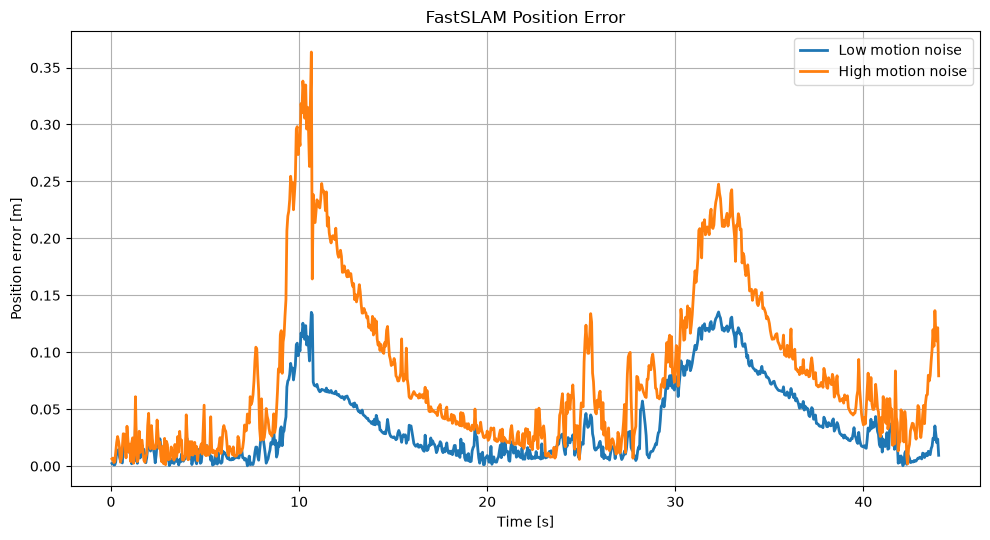

In [23]:
low_error = position_error(low_noise_result)
high_error = position_error(high_noise_result)

time = np.arange(1, len(control_sequence) + 1) * dt

fig, ax = plt.subplots(figsize=(10, 5.5))

ax.plot(
    time,
    low_error,
    linewidth=2,
    label="Low motion noise"
)

ax.plot(
    time,
    high_error,
    linewidth=2,
    label="High motion noise"
)

ax.set_title("FastSLAM Position Error")
ax.set_xlabel("Time [s]")
ax.set_ylabel("Position error [m]")
ax.grid(True)
ax.legend()

fig.tight_layout()
plt.show()


### Error Analysis

The position error is defined as

$$
e_t =
\sqrt{
(x_t-\hat{x}_t)^2 +
(y_t-\hat{y}_t)^2
}.
$$

The comparison between the two experiments provides a quantitative measure of the influence of motion uncertainty on the FastSLAM estimate. The error curves should be interpreted together with the particle dispersion, since increased motion uncertainty produces a wider range of pose hypotheses that must subsequently be corrected using landmark observations.

### Quantitative Error Analysis

To complement the temporal error curves, the Root Mean Square Error (RMSE) is computed for each experiment:

$$
\mathrm{RMSE}
=
\sqrt{
\frac{1}{T}
\sum_{t=1}^{T} e_t^2
}.
$$

The RMSE provides a single measure of the overall position estimation error throughout the simulation, allowing the effect of motion uncertainty to be quantitatively compared between the two experiments.

In [24]:
low_rmse = np.sqrt(np.mean(low_error**2))
high_rmse = np.sqrt(np.mean(high_error**2))

print(f"Low motion noise RMSE:  {low_rmse:.4f} m")
print(f"High motion noise RMSE: {high_rmse:.4f} m")

Low motion noise RMSE:  0.0492 m
High motion noise RMSE: 0.1067 m


## 8. FastSLAM 2.0 Overview

FastSLAM 2.0 extends the FastSLAM 1.0 formulation by incorporating the current measurement into the proposal distribution used to sample the robot pose.

In FastSLAM 1.0, the new pose is sampled only from the motion model:

$$
x_t^{[k]}
\sim
p\left(x_t \mid x_{t-1}^{[k]},u_t\right).
$$

Consequently, the particle prediction is driven exclusively by the control input and the motion uncertainty. The measurement is incorporated afterwards through landmark association and map updates.

FastSLAM 2.0 instead uses a proposal distribution that incorporates both the motion model and the current observation:

$$
x_t^{[k]}
\sim
p\left(
x_t
\mid
x_{t-1}^{[k]},
u_t,
z_t
\right).
$$

The current measurement therefore provides information about the robot pose **before the particle is sampled**. This produces a proposal distribution that is more consistent with the available sensor observation.

Conceptually, the main difference between the two formulations is therefore the proposal distribution:

$$
\boxed{
\text{FastSLAM 1.0: }
p(x_t \mid x_{t-1},u_t)
}
$$

versus

$$
\boxed{
\text{FastSLAM 2.0: }
p(x_t \mid x_{t-1},u_t,z_t)
}.
$$

The landmark estimates are still maintained independently within each particle using EKF-based updates. Thus, the main modification introduced by FastSLAM 2.0 concerns the **proposal distribution for the robot pose**, rather than the fundamental representation of the landmark maps.

In the following section, both algorithms are evaluated using the same environment, landmark configuration, control sequence, sensor model, number of particles, and motion-noise levels.

## 9. FastSLAM 1.0 vs FastSLAM 2.0

FastSLAM 1.0 and FastSLAM 2.0 are evaluated under the same experimental conditions to provide a consistent comparison between the two algorithms. Both methods use the same simulation environment, landmark map, control sequence, sensor model, number of particles, and motion-noise levels.

The main difference between the two implementations is the proposal distribution used to sample the robot pose. FastSLAM 1.0 samples the new pose from the motion model, while FastSLAM 2.0 incorporates the current measurement into the proposal distribution.

The same simulation and analysis functions are reused for both algorithms. Therefore, the comparison is performed by changing only the FastSLAM implementation passed to `run_experiment`, while keeping the remaining experimental configuration unchanged.

In [25]:
ALGORITHMS = [
    ("FastSLAM 1.0", FastSLAM),
    ("FastSLAM 2.0", FastSLAM2),
]

NOISE_LEVELS = [
    ("Low", LOW_MOTION_NOISE),
    ("High", HIGH_MOTION_NOISE),
]

comparison_results = {}

for algorithm_name, algorithm_cls in ALGORITHMS:
    for noise_name, noise_value in NOISE_LEVELS:
        print(f"Running {algorithm_name} — {noise_name} motion noise ...")
        comparison_results[(algorithm_name, noise_name)] = run_experiment(
            noise_value,
            seed=42,
            algorithm_cls=algorithm_cls
        )


Running FastSLAM 1.0 — Low motion noise ...
Running FastSLAM 1.0 — High motion noise ...
Running FastSLAM 2.0 — Low motion noise ...
Running FastSLAM 2.0 — High motion noise ...


### Trajectory Comparison

The four experiments below use the same ground-truth trajectory. The columns correspond to the motion-noise level, while the rows correspond to the FastSLAM variant.


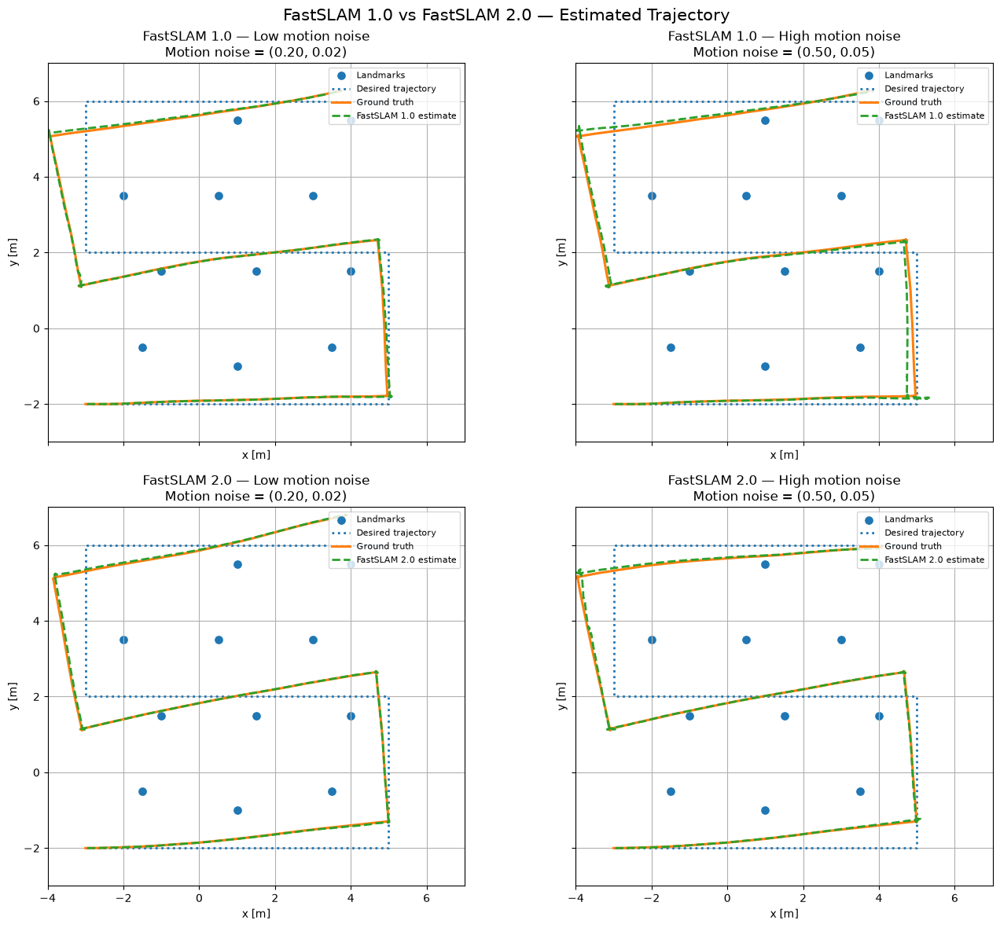

In [26]:
fig, axes = plt.subplots(
    2, 2,
    figsize=(14, 12),
    sharex=True,
    sharey=True
)

landmark_x = [lm.pos.x for lm in landmarks]
landmark_y = [lm.pos.y for lm in landmarks]

for row, (algorithm_name, _) in enumerate(ALGORITHMS):
    for col, (noise_name, noise_value) in enumerate(NOISE_LEVELS):
        ax = axes[row, col]
        result = comparison_results[(algorithm_name, noise_name)]

        desired = result["desired_poses"]
        gt = result["ground_truth"]
        est = result["estimated"]

        ax.scatter(landmark_x, landmark_y, marker="o", s=45, label="Landmarks")
        ax.plot([p.x for p in desired], [p.y for p in desired], linestyle=":", linewidth=2.0, label="Desired trajectory")
        ax.plot([p.x for p in gt], [p.y for p in gt], linewidth=2.2, label="Ground truth")
        ax.plot([p.x for p in est], [p.y for p in est], linestyle="--", linewidth=2.0, label=f"{algorithm_name} estimate")

        ax.set_title(
            f"{algorithm_name} — {noise_name} motion noise\n"
            f"Motion noise = ({noise_value[0]:.2f}, {noise_value[1]:.2f})"
        )
        ax.set_xlabel("x [m]")
        ax.set_ylabel("y [m]")
        ax.set_xlim(*x_lims)
        ax.set_ylim(*y_lims)
        ax.set_aspect("equal")
        ax.grid(True)
        ax.legend(fontsize=8)

fig.suptitle("FastSLAM 1.0 vs FastSLAM 2.0 — Estimated Trajectory", fontsize=15)
fig.tight_layout()
plt.show()


### Position Error Comparison

For each experiment, the position error is evaluated using the Euclidean distance between the estimated and ground-truth positions.


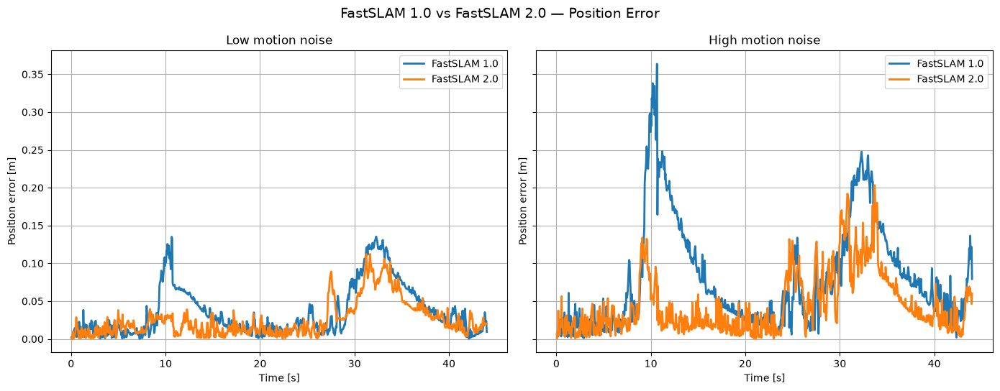

In [27]:
time = np.arange(1, len(control_sequence) + 1) * dt

fig, axes = plt.subplots(1, 2, figsize=(14, 5.5), sharex=True, sharey=True)
comparison_errors = {}

for col, (noise_name, noise_value) in enumerate(NOISE_LEVELS):
    ax = axes[col]

    for algorithm_name, _ in ALGORITHMS:
        error = position_error(comparison_results[(algorithm_name, noise_name)])
        comparison_errors[(algorithm_name, noise_name)] = error

        ax.plot(time, error, linewidth=2, label=algorithm_name)

    ax.set_title(f"{noise_name} motion noise")
    ax.set_xlabel("Time [s]")
    ax.set_ylabel("Position error [m]")
    ax.grid(True)
    ax.legend()

fig.suptitle("FastSLAM 1.0 vs FastSLAM 2.0 — Position Error", fontsize=14)
fig.tight_layout()
plt.show()


### Summary Statistics

The following statistics summarize the position error and the effective number of particles for each experiment.


In [28]:
print(f"{'Algorithm':<15}{'Noise':<8}{'Mean err. [m]':<16}{'Max err. [m]':<15}{'RMSE [m]':<12}{'Median N_eff':<14}")
print("-" * 80)

for algorithm_name, _ in ALGORITHMS:
    for noise_name, _ in NOISE_LEVELS:
        error = comparison_errors[(algorithm_name, noise_name)]
        n_eff = comparison_results[(algorithm_name, noise_name)]["n_eff"]
        rmse = np.sqrt(np.mean(error**2))

        print(
            f"{algorithm_name:<15}{noise_name:<8}"
            f"{error.mean():<16.4f}{error.max():<15.4f}"
            f"{rmse:<12.4f}{np.median(n_eff):<14.1f}"
        )


Algorithm      Noise   Mean err. [m]   Max err. [m]   RMSE [m]    Median N_eff  
--------------------------------------------------------------------------------
FastSLAM 1.0   Low     0.0357          0.1353         0.0492      46.7          
FastSLAM 1.0   High    0.0803          0.3636         0.1067      39.9          
FastSLAM 2.0   Low     0.0255          0.1123         0.0346      47.7          
FastSLAM 2.0   High    0.0451          0.2033         0.0604      44.7          


### Interpretation

The comparison isolates the effect of the proposal distribution used by the two FastSLAM variants. Since the environment, observations, controls, and motion-noise levels are shared, differences in the resulting trajectories and error curves can be attributed to the algorithmic formulation rather than to a different experimental setup.


## 9. FastSLAM Animation

The same particle-filter evolution can be inspected dynamically for each motion-noise level.


In [29]:
def animate_experiment(result, title, frame_step=4):
    des = result["desired_poses"]
    gt = result["ground_truth"]
    est = result["estimated"]

    particles = result["particles"]
    particle_maps = result["particle_maps"]
    n_eff = result["n_eff"]
    measurements = result["measurements"]

    frames = range(
        0,
        len(particles),
        frame_step
    )
    fig, ax = plt.subplots(figsize=(8, 7))

    def update(frame_index):
        ax.clear()

        ax.scatter(
            [lm.pos.x for lm in landmarks],
            [lm.pos.y for lm in landmarks],
            marker="o",
            s=45,
            label="Ground truth landmarks"
        )


        current_map = particle_maps[frame_index]

        if current_map:
            ax.scatter(
                [v["mu"][0, 0] for v in current_map.values()],
                [v["mu"][1, 0] for v in current_map.values()],
                marker="x",
                s=65,
                linewidths=2,
                label="Estimated landmarks"
            )


        ax.plot(
            [p.x for p in gt[:frame_index + 2]],
            [p.y for p in gt[:frame_index + 2]],
            linewidth=2,
            label="Ground truth"
        )


        ax.plot(
            [p.x for p in des[:frame_index + 2]],
            [p.y for p in des[:frame_index + 2]],
            linestyle=":",
            linewidth=2,
            label="Desired trajectory"
        )


        ax.scatter(
            [p.x for p in particles[frame_index]],
            [p.y for p in particles[frame_index]],
            s=18,
            alpha=0.55,
            label="Particles"
        )


        ax.plot(
            [p.x for p in est[:frame_index + 1]],
            [p.y for p in est[:frame_index + 1]],
            linestyle="--",
            linewidth=2,
            label="FastSLAM estimate"
        )


        current_gt = gt[frame_index + 1]
        ax.scatter(
            current_gt.x,
            current_gt.y,
            marker="x",
            s=90,
            linewidths=2,
            label="Robot"
        )

        ax.set_xlim(*x_lims)
        ax.set_ylim(*y_lims)
        ax.set_aspect("equal")

        ax.set_xlabel("x [m]")
        ax.set_ylabel("y [m]")

        ax.set_title(
            f"{title} — t = {frame_index * dt:.2f} s"
        )

        ax.grid(True)
        ax.legend(loc="upper right")


        ax.text(
            0.02,
            0.02,
            f"N particles: {N_PARTICLES}\n"
            f"N observed landmarks: {len(current_map)}\n"
            f"N detected landmarks: "
            f"{len(measurements[frame_index])}\n"
            f"$N_{{eff}}$: {n_eff[frame_index]:.1f}",
            transform=ax.transAxes,
            verticalalignment="bottom",
            bbox=dict(
                boxstyle="round",
                facecolor="white",
                alpha=0.8
            )
        )

    ani = FuncAnimation(
        fig,
        update,
        frames=frames,
        interval=50,
        repeat=False,
        blit=False
    )

    os.makedirs("img", exist_ok=True)
    filename = title.lower().replace(" ", "_")

    ani.save(
        f"img/{filename}.gif",
        writer="pillow",
        fps=20
    )

    plt.close(fig)

    display(
        HTML(ani.to_jshtml())
    )

    return ani

### Low Motion Noise


In [ ]:
animate_experiment(low_noise_result, "FastSLAM — Low Motion Noise")

### High Motion Noise


In [ ]:
animate_experiment(high_noise_result, "FastSLAM — High Motion Noise")

### FastSLAM 2.0 — Low Motion Noise


In [ ]:
animate_experiment(
    comparison_results[("FastSLAM 2.0", "High")],
    f"FastSLAM 2.0 - High Motion Noise ({HIGH_MOTION_NOISE[0]:.2f}, {HIGH_MOTION_NOISE[1]:.2f})"
)

### FastSLAM 2.0 — High Motion Noise


In [ ]:
animate_experiment(
    comparison_results[("FastSLAM 2.0", "High")],
    f"FastSLAM 2.0 - High Motion Noise ({HIGH_MOTION_NOISE[0]:.2f}, {HIGH_MOTION_NOISE[1]:.2f})"
)

## 10. Conclusion

The FastSLAM 1.0 implementation successfully combines particle-based pose estimation with individual landmark estimates maintained by EKF updates. The experiments illustrate how motion uncertainty affects the dispersion of the particle set and, consequently, the accuracy of the estimated trajectory.

The results also highlight the role of measurement likelihoods in associating observations with landmarks and in evaluating the consistency of particle hypotheses. Overall, the implementation provides a practical demonstration of the Rao-Blackwellized particle-filter formulation of FastSLAM and its ability to jointly estimate the robot trajectory and the environment map under uncertainty.